### Practica 04 | PDI 
## Vargas Bravo Paola

In [3]:
import  PIL
from PIL import Image,ImageFilter
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import math
from skimage.util import random_noise
import cv2
from scipy.fft import fft2

In [24]:
def show_image(image) :
  arr = np.asarray(image)
  plt.imshow(arr, cmap='gray')#, vmin=0, vmax=255)
  plt.show()

## Ejercico 1

In [93]:
def apply_TFF(imagen) :
  try :
    if (imagen.endswith((".jpg", ".png", ".tiff", ".tif",".bmp")) and os.path.exists(imagen)):
      image = Image.open(imagen)
      if image.mode == "L":      
            image_array = np.array(image)
            #Con corrimiento 
            alto, ancho = image_array.shape
            x, y = np.meshgrid(np.arange(ancho), np.arange(alto))
            image_centrada = image * (-1) ** (x + y) 
            TFF_CC = np.fft.fft2(image_centrada)
            magnitud_CC = np.abs(TFF_CC)
            fase_CC = np.angle(TFF_CC)
        
            amplitud_CC  = np.log(1 + magnitud_CC) 
        
            #Sin corrimiento
            TFF_SC = fft2(image)
            magnitud_SC = np.abs(TFF_SC)
            amplitud_SC  = np.log(1 + magnitud_SC) 
            fase_SC = np.angle(TFF_SC)
        
            #Regresar la Imagen
            TFF_I = np.fft.ifft2(TFF_CC)
            corrimiento = (-1) ** (x + y) 
            R_I = np.real(TFF_I)
            imagen_objetivo = R_I * corrimiento
            
            # Regresar solo la amplitud
            amplitud_I = np.fft.ifft2(magnitud_CC)
            amplitud_I  = np.abs(amplitud_I)
            #amplitud_I = np.log(1 + amplitud_I) 
        
            #Regresar solo la fase
            fase_I = np.fft.ifft2(np.exp(fase_CC*1j))
            fase_I = np.abs(fase_I)
            
            plt.figure(figsize=(30, 30)) 
            plt.subplot(421)
            plt.imshow(amplitud_SC, cmap='gray')
            plt.title('Magnitud SC')
        
            plt.subplot(422)
            plt.imshow(fase_SC, cmap='gray')
            plt.title('Fase SC')
        
            plt.subplot(423)
            plt.imshow(amplitud_CC, cmap='gray')
            plt.title('Magnitud CC')
        
            plt.subplot(424)
            plt.imshow(fase_CC, cmap='gray')
            plt.title('Fase CC')
        
            plt.subplot(425)
            plt.imshow(imagen_objetivo, cmap='gray')
            plt.title('Imagen Regresada')
        
            plt.subplot(426)
            plt.imshow(amplitud_I, cmap='gray',vmin=0,vmax=255)
            plt.title('Imagen Regresada S/A')
        
            plt.subplot(427)
            plt.imshow(fase_I, cmap='gray')
            plt.title('Imagen Regresada S/F')
        
            plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0.1, hspace=0.5)

      else :
        print("Se solicita una imagen en escala de grises")
    else:
        raise ValueError("La imagen no tiene la extensión .jpg|.png|.tiff|.tif|.bmp o no existe el archivo")
  except ValueError as e:
          print(f"Error: {e}")

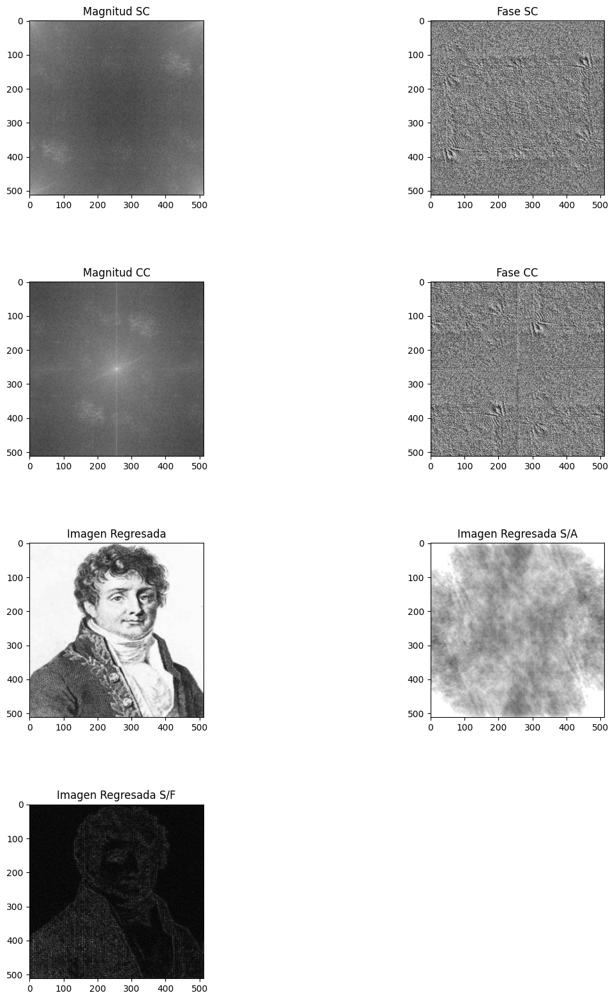

In [4]:
apply_TFF('fourier.bmp')

## Ejercicio 2

### Filtro paso bajas Buttewoth

In [8]:
def ruido_sal_pimienta(imagen, probabilidad_ruido=0.04):
    imagen_np = np.array(imagen)
    ruido = np.random.rand(*imagen_np.shape)
    mascara_sal = ruido < probabilidad_ruido / 2
    mascara_pimienta = ruido > 1 - probabilidad_ruido / 2
    imagen_con_ruido = np.copy(imagen_np)
    imagen_con_ruido[mascara_sal] = 0  # Sal: establece píxeles a negro
    imagen_con_ruido[mascara_pimienta] = 255  # Pimienta: establece píxeles a blanco
    imagen_con_ruido_pil = Image.fromarray(imagen_con_ruido)
    return imagen_con_ruido_pil

In [7]:
img1  = Image.open('saturn_bw.tif')
img2  = Image.open('imagenA.tif')

In [43]:
img_ruidoSP1 = ruido_sal_pimienta(img1)
img_ruidoSP2 = ruido_sal_pimienta(img2)

In [11]:
def filtro_butterwoth_pb(image,D0,n) :
  image_array = np.array(image)
  alto,ancho = image_array.shape
  u = np.arange(ancho)
  v = np.arange(alto)
  u,v  = np.meshgrid(u,v)
  forma = np.sqrt((u - (ancho/2))**2 + (v - (alto/2))**2)
  exponente = 2 * n
  filtro = 1 / (1 + (forma / D0)**(exponente))
  return filtro

In [55]:
def apply_FB_pb(image, D0, n, tipoFiltro):
    filtros = ['pb', 'pa']
    try:
        if isinstance(image, Image.Image):
            if image.mode == "L" and n > 0 and D0 > 0 and tipoFiltro in filtros:
                image_array = np.array(image)
                alto, ancho = image_array.shape
                x, y = np.meshgrid(np.arange(ancho), np.arange(alto))
                image_centrada = image * (-1) ** (x + y)
                TFF_CC = fft2(image_centrada)
                if tipoFiltro == 'pb':
                    H = filtro_butterwoth_pb(image, D0, n)
                elif tipoFiltro == 'pa':
                    H = filtro_butterwoth_pb(image, D0, n)
                    H = 1 - H
                G = H * TFF_CC
                TFF_I = np.fft.ifft2(G)
                corrimiento = (-1) ** (x + y)
                #TFF_I = np.abs(TFF_I)
                R_I = np.real(TFF_I)
                imagen_objetivo = R_I * corrimiento
                #itf = np.fft.ifft2(ctf)
                #itf = abs(itf)
                #itf = np.real(itf)
                return imagen_objetivo, H  , np.log(1 + np.abs(G))
            else:
                print("Se solicita una imagen en escala de grises")
                print("Se solicita un tipo de filtro válido [pa,pb]")
                print("Se solicita una imagen de objeto PIL")
        else:
            raise ValueError("Se solicita una imagen de objeto tipo PIL")
    except ValueError as e:
        print(f"Error: {e}")

In [44]:
i,j,TF_IO,z = apply_FB_pb(img2,5,2,'pb')
i,j,TF_SP,z = apply_FB_pb(img_ruidoSP2,5,2,'pb')

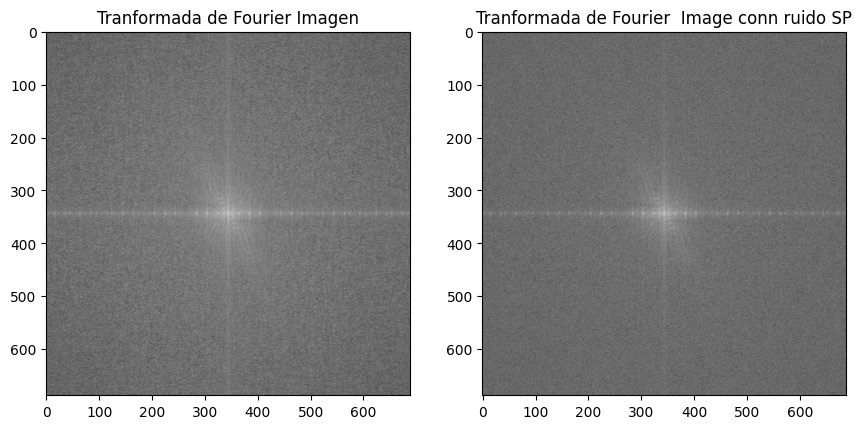

In [54]:
    plt.figure(figsize=(20, 20))
    plt.subplot(1,2,1)
    plt.imshow(TF_IO, cmap='gray')
    plt.title('Tranformada de Fourier Imagen')

    plt.subplot(1,2,2)
    plt.imshow(TF_SP, cmap='gray')
    plt.title('Tranformada de Fourier  Image conn ruido SP')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.4, wspace=0.2, hspace=0.3)

In [56]:
### n = 2
img_1,H1 , G1 = apply_FB_pb(img2,5,2,'pb')
img_2 ,H2 , G2= apply_FB_pb(img2,15,2,'pb')
img_3,H3, G3 = apply_FB_pb(img2,100,2,'pb')
img_4e,H4, G4 = apply_FB_pb(img2,230,2,'pb')
#### n = 5
img_4,H5 , G5= apply_FB_pb(img2,5,5,'pb')
img_5,H6 , G6 = apply_FB_pb(img2,15,5,'pb')
img_6,H7 , G7= apply_FB_pb(img2,100,5,'pb')
img_7e,H8 , G8= apply_FB_pb(img2,230,5,'pb')
### n = 10
img_7,H9 ,  G9 = apply_FB_pb(img2,5,10,'pb')
img_8,H10, G10 = apply_FB_pb(img2,15,10,'pb')
img_9,H11, G11 = apply_FB_pb(img2,100,10,'pb')
img_9e,H12 , G12= apply_FB_pb(img2,230,10,'pb')
## n = 15 direferente D0
img_10,H13,G13 = apply_FB_pb(img2,5,15,'pb')
img_11,H14, G14 = apply_FB_pb(img2,15,15,'pb')
img_12,H15, G15 = apply_FB_pb(img2,100,15,'pb')
img_12e,H16,G16 = apply_FB_pb(img2,230,15,'pb')

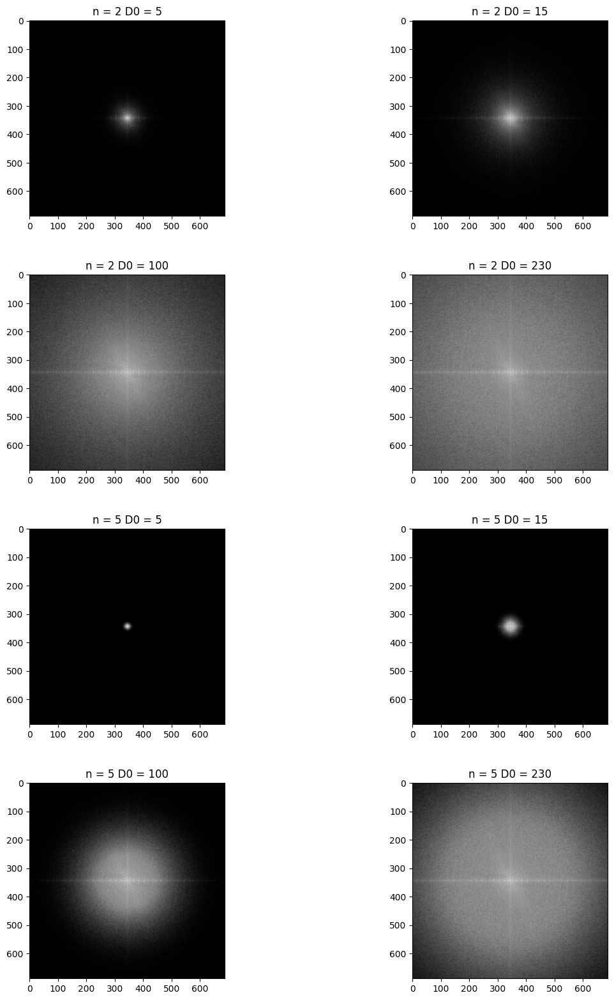

In [60]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,2,1)
    plt.imshow(G1, cmap='gray')
    plt.title('n = 2 D0 = 5')

    plt.subplot(4,2,2)
    plt.imshow(G2, cmap='gray')
    plt.title('n = 2 D0 = 15')

    plt.subplot(4,2,3)
    plt.imshow(G3, cmap='gray')
    plt.title('n = 2 D0 = 100')

    plt.subplot(4,2,4)
    plt.imshow(G4, cmap='gray')
    plt.title('n = 2 D0 = 230')

    plt.subplot(4,2,5)
    plt.imshow(G5, cmap='gray')
    plt.title('n = 5 D0 = 5')

    plt.subplot(4,2,6)
    plt.imshow(G6, cmap='gray')
    plt.title('n = 5 D0 = 15')

    plt.subplot(4,2,7)
    plt.imshow(G7, cmap='gray')
    plt.title('n = 5 D0 = 100')

    plt.subplot(4,2,8)
    plt.imshow(G8, cmap='gray')
    plt.title('n = 5 D0 = 230')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

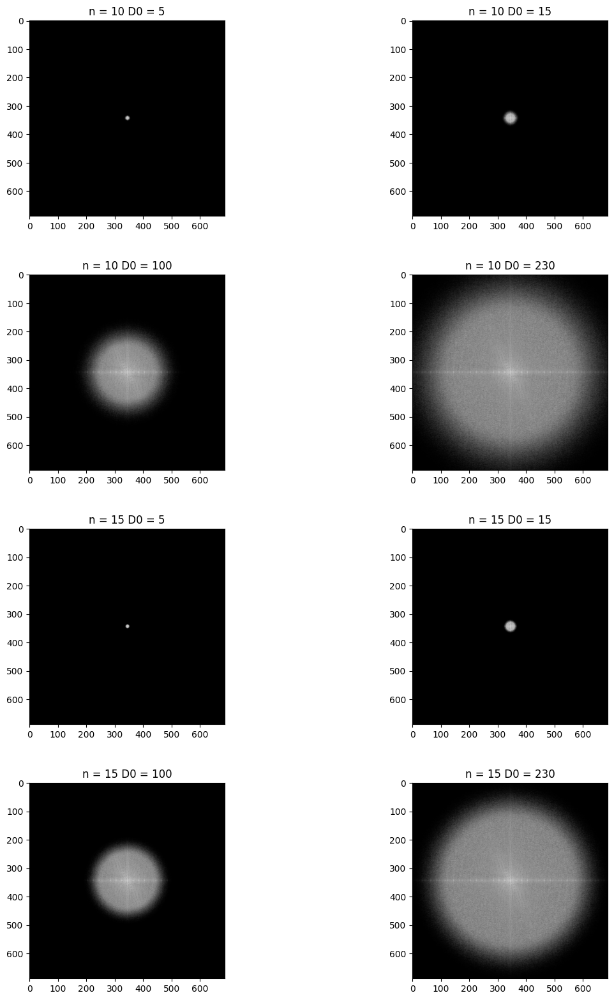

In [61]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,2,1)
    plt.imshow(G9, cmap='gray')
    plt.title('n = 10 D0 = 5')

    plt.subplot(4,2,2)
    plt.imshow(G10, cmap='gray')
    plt.title('n = 10 D0 = 15')

    plt.subplot(4,2,3)
    plt.imshow(G11, cmap='gray')
    plt.title('n = 10 D0 = 100')

    plt.subplot(4,2,4)
    plt.imshow(G12, cmap='gray')
    plt.title('n = 10 D0 = 230')

    plt.subplot(4,2,5)
    plt.imshow(G13, cmap='gray')
    plt.title('n = 15 D0 = 5')

    plt.subplot(4,2,6)
    plt.imshow(G14, cmap='gray')
    plt.title('n = 15 D0 = 15')

    plt.subplot(4,2,7)
    plt.imshow(G15, cmap='gray')
    plt.title('n = 15 D0 = 100')

    plt.subplot(4,2,8)
    plt.imshow(G16, cmap='gray')
    plt.title('n = 15 D0 = 230')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

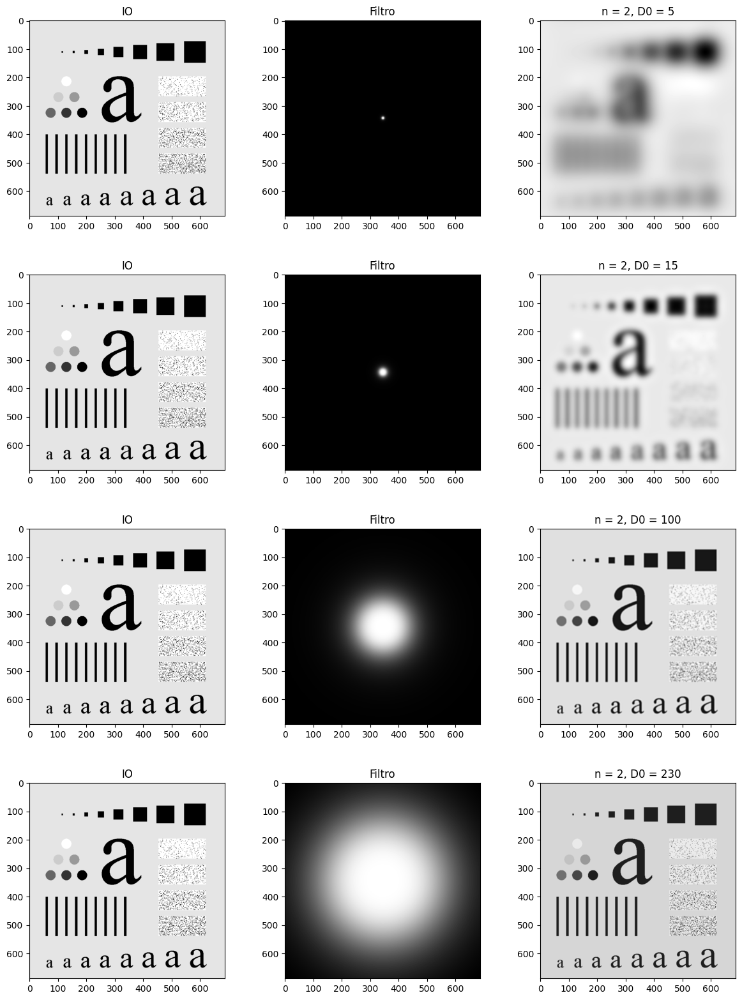

In [9]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H1, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_1, cmap='gray')
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H2, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_2, cmap='gray')
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H3, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_3, cmap='gray')
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H4, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_4e, cmap='gray')
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

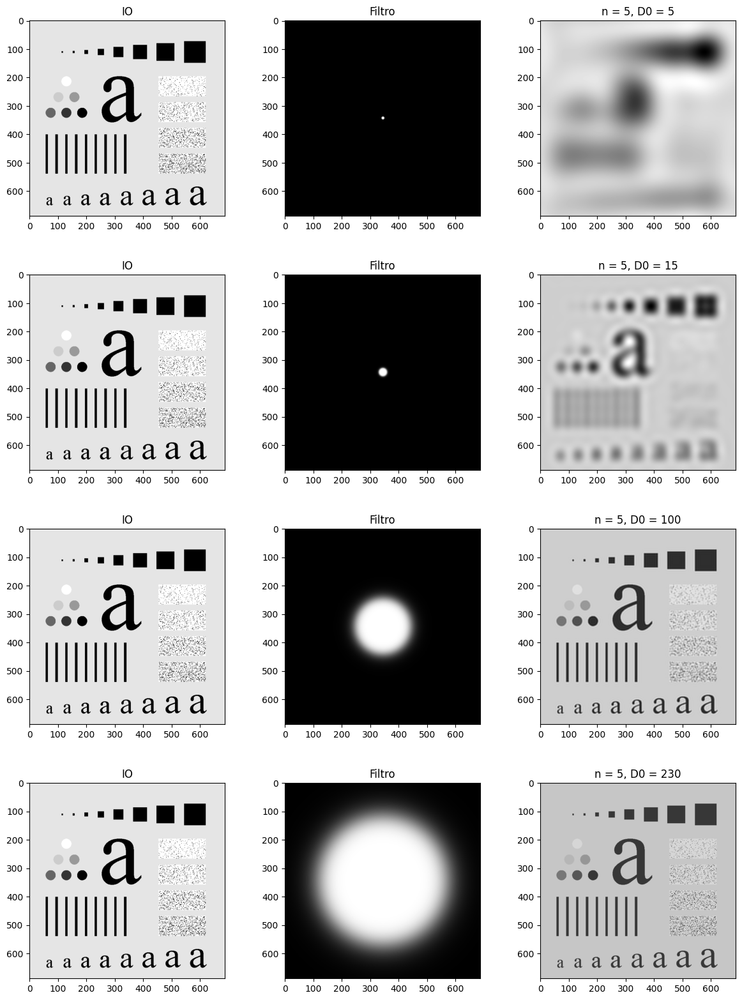

In [10]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H5, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_4, cmap='gray')
    plt.title('n = 5, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H6, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_5, cmap='gray')
    plt.title('n = 5, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H7, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_6, cmap='gray')
    plt.title('n = 5, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H8, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_7e, cmap='gray')
    plt.title('n = 5, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

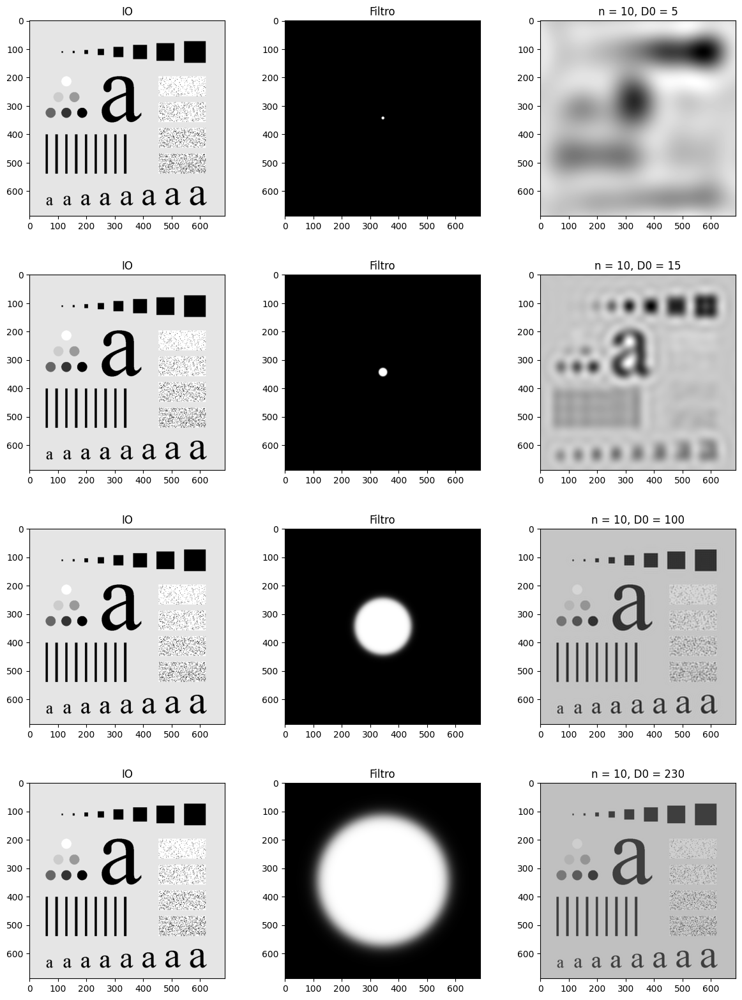

In [11]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H9, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_7, cmap='gray')
    plt.title('n = 10, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H10, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_8, cmap='gray')
    plt.title('n = 10, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H11, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_9, cmap='gray')
    plt.title('n = 10, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H12, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_9e, cmap='gray')
    plt.title('n = 10, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

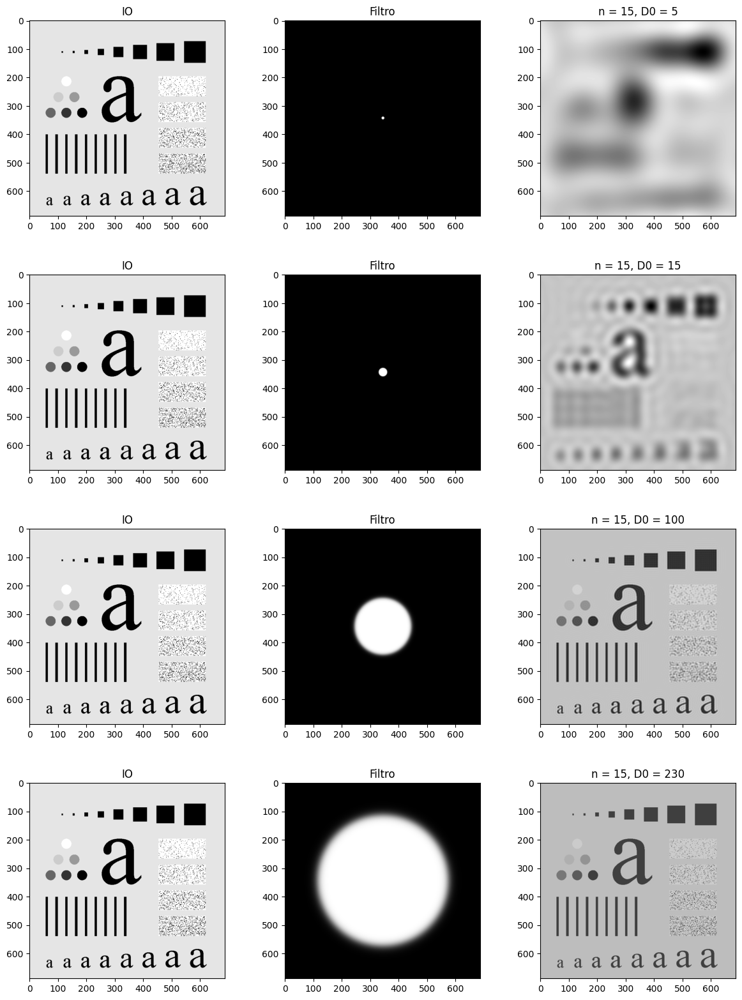

In [12]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H13, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_10, cmap='gray')
    plt.title('n = 15, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H14, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_11, cmap='gray')
    plt.title('n = 15, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H15, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_12, cmap='gray')
    plt.title('n = 15, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray')
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H16, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_12e, cmap='gray')
    plt.title('n = 15, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

In [62]:
### n = 2
img_1_1 ,H17,G17  = apply_FB_pb(img_ruidoSP2,5,2,'pb')
img_2_2 ,H18 ,G18 = apply_FB_pb(img_ruidoSP2,15,2,'pb')
img_3_3 ,H19 ,G19 = apply_FB_pb(img_ruidoSP2,100,2,'pb')
img_3_3_e,H20 ,G20= apply_FB_pb(img_ruidoSP2,230,2,'pb')
#### n = 5
img_4_4,H21,G21 = apply_FB_pb(img_ruidoSP2,5,5,'pb')
img_5_5,H22,G22 = apply_FB_pb(img_ruidoSP2,15,5,'pb')
img_6_6,H23,G23 = apply_FB_pb(img_ruidoSP2,100,5,'pb')
img_6_6_e,H24,G24 = apply_FB_pb(img_ruidoSP2,230,5,'pb')
### n = 10
img_7_7,H25 ,G25= apply_FB_pb(img_ruidoSP2,5,10,'pb')
img_8_8,H26,G26 = apply_FB_pb(img_ruidoSP2,15,10,'pb')
img_9_9,H27 ,G27= apply_FB_pb(img_ruidoSP2,100,10,'pb')
img_9_9_e,H28,G28 = apply_FB_pb(img_ruidoSP2,230,10,'pb')
## n = 2 direferente D0
img_10_10,H29,G29 = apply_FB_pb(img_ruidoSP2,5,15,'pb')
img_11_11,H30,G30 = apply_FB_pb(img_ruidoSP2,15,15,'pb')
img_12_12,H31,G31 = apply_FB_pb(img_ruidoSP2,100,15,'pb')
img_12_12_e,H32,G32 = apply_FB_pb(img_ruidoSP2,230,15,'pb')

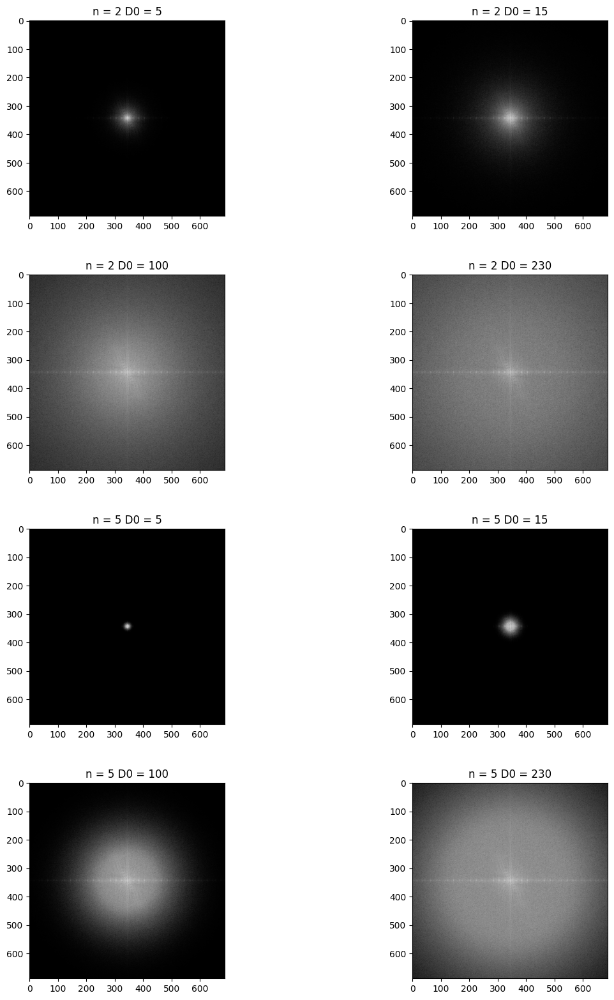

In [63]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,2,1)
    plt.imshow(G17, cmap='gray')
    plt.title('n = 2 D0 = 5')

    plt.subplot(4,2,2)
    plt.imshow(G18, cmap='gray')
    plt.title('n = 2 D0 = 15')

    plt.subplot(4,2,3)
    plt.imshow(G19, cmap='gray')
    plt.title('n = 2 D0 = 100')

    plt.subplot(4,2,4)
    plt.imshow(G20, cmap='gray')
    plt.title('n = 2 D0 = 230')

    plt.subplot(4,2,5)
    plt.imshow(G21, cmap='gray')
    plt.title('n = 5 D0 = 5')

    plt.subplot(4,2,6)
    plt.imshow(G22, cmap='gray')
    plt.title('n = 5 D0 = 15')

    plt.subplot(4,2,7)
    plt.imshow(G23, cmap='gray')
    plt.title('n = 5 D0 = 100')

    plt.subplot(4,2,8)
    plt.imshow(G24, cmap='gray')
    plt.title('n = 5 D0 = 230')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

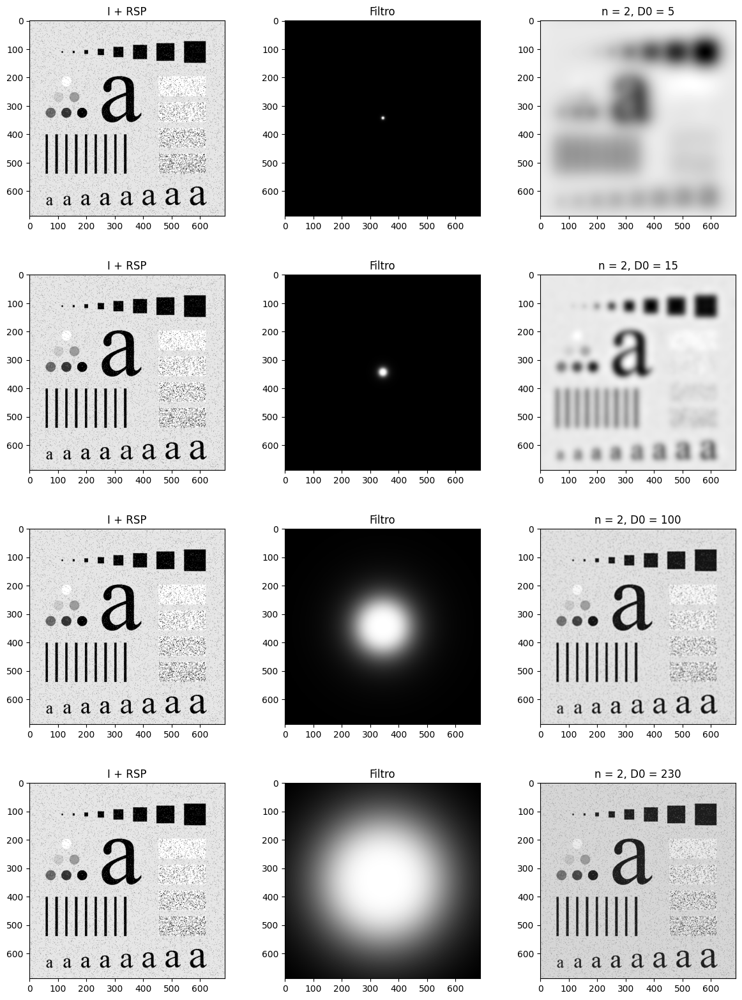

In [14]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H17, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_1_1, cmap='gray')
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H18, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_2_2, cmap='gray')
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H19, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_3_3, cmap='gray')
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H20, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_3_3_e, cmap='gray')
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

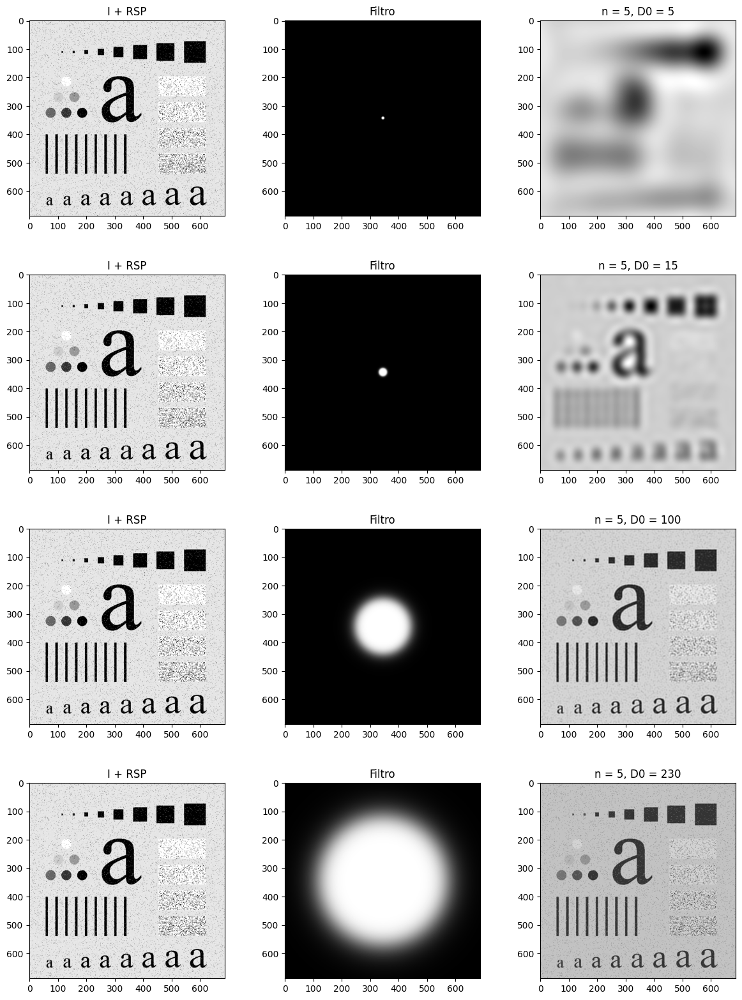

In [69]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H21, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_4_4, cmap='gray')
    plt.title('n = 5, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H22, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_5_5, cmap='gray')
    plt.title('n = 5, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H23, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_6_6, cmap='gray')
    plt.title('n = 5, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H24, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_6_6_e, cmap='gray')
    plt.title('n = 5, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

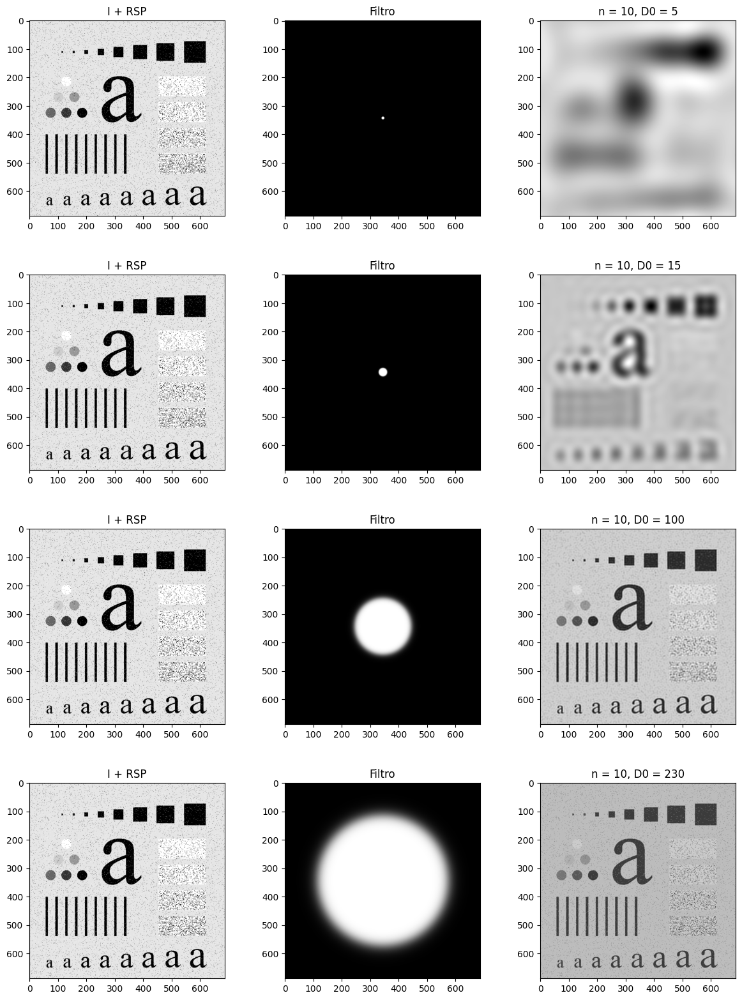

In [70]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H25, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_7_7, cmap='gray')
    plt.title('n = 10, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H26, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_8_8, cmap='gray')
    plt.title('n = 10, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H27, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_9_9, cmap='gray')
    plt.title('n = 10, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H28, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_9_9_e, cmap='gray')
    plt.title('n = 10, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

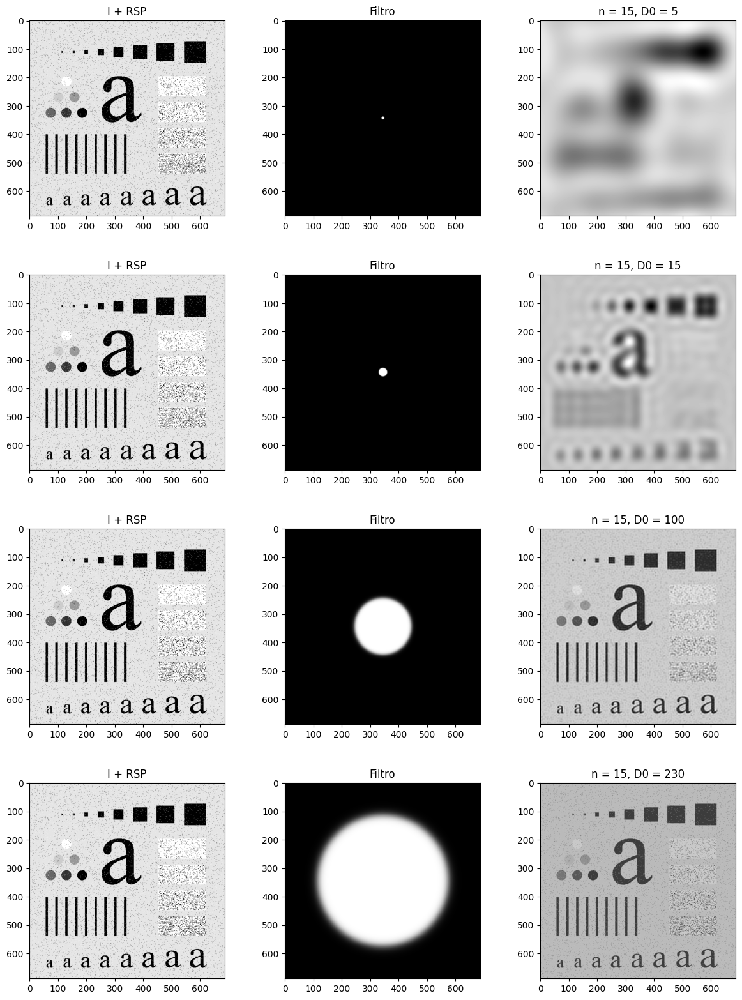

In [71]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H29, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(img_10_10, cmap='gray')
    plt.title('n = 15, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H30, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(img_11_11, cmap='gray')
    plt.title('n = 15, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H31, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(img_12_12, cmap='gray')
    plt.title('n = 15, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray')
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H32, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(img_12_12_e, cmap='gray')
    plt.title('n = 15, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

## Ejericicio 3

### Filtro paso altas Buttewoth

In [64]:
### n = 2
iMg_1, H_1 ,G_1 = apply_FB_pb(img2,5,2,'pa')
iMg_2, H_2 ,G_2 = apply_FB_pb(img2,15,2,'pa')
iMg_3, H_3 ,G_3= apply_FB_pb(img2,100,2,'pa')
iMg_4e,H_4 ,G_4= apply_FB_pb(img2,230,2,'pa')
#### n = 5
iMg_4 ,H_5 ,G_5= apply_FB_pb(img2,5,5,'pa')
iMg_5,H_6,G_6 = apply_FB_pb(img2,15,5,'pa')
iMg_6,H_7 ,G_7= apply_FB_pb(img2,100,5,'pa')
iMg_6e,H_8 ,G_8= apply_FB_pb(img2,230,5,'pa')
### n = 10
iMg_7,H_9 ,G_9= apply_FB_pb(img2,5,10,'pa')
iMg_8,H_10 ,G_10= apply_FB_pb(img2,15,10,'pa')
iMg_9,H_11 ,G_11= apply_FB_pb(img2,100,10,'pa')
iMg_9e,H_12 ,G_12= apply_FB_pb(img2,230,10,'pa')
## n = 2 direferente D0
iMg_10,H_13,G_13 = apply_FB_pb(img2,5,15,'pa')
iMg_11,H_14,G_14 = apply_FB_pb(img2,15,15,'pa')
iMg_12,H_15 ,G_15= apply_FB_pb(img2,100,15,'pa')
iMg_12e,H_16 ,G_16= apply_FB_pb(img2,230,15,'pa')

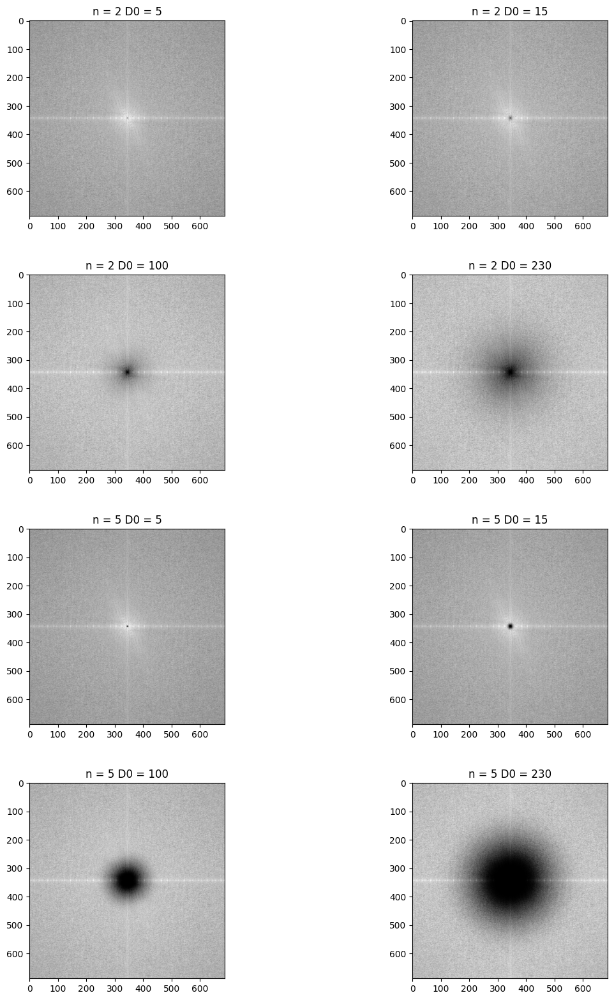

In [65]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,2,1)
    plt.imshow(G_1, cmap='gray')
    plt.title('n = 2 D0 = 5')

    plt.subplot(4,2,2)
    plt.imshow(G_2, cmap='gray')
    plt.title('n = 2 D0 = 15')

    plt.subplot(4,2,3)
    plt.imshow(G_3, cmap='gray')
    plt.title('n = 2 D0 = 100')

    plt.subplot(4,2,4)
    plt.imshow(G_4, cmap='gray')
    plt.title('n = 2 D0 = 230')

    plt.subplot(4,2,5)
    plt.imshow(G_5, cmap='gray')
    plt.title('n = 5 D0 = 5')

    plt.subplot(4,2,6)
    plt.imshow(G_6, cmap='gray')
    plt.title('n = 5 D0 = 15')

    plt.subplot(4,2,7)
    plt.imshow(G_7, cmap='gray')
    plt.title('n = 5 D0 = 100')

    plt.subplot(4,2,8)
    plt.imshow(G_8, cmap='gray')
    plt.title('n = 5 D0 = 230')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

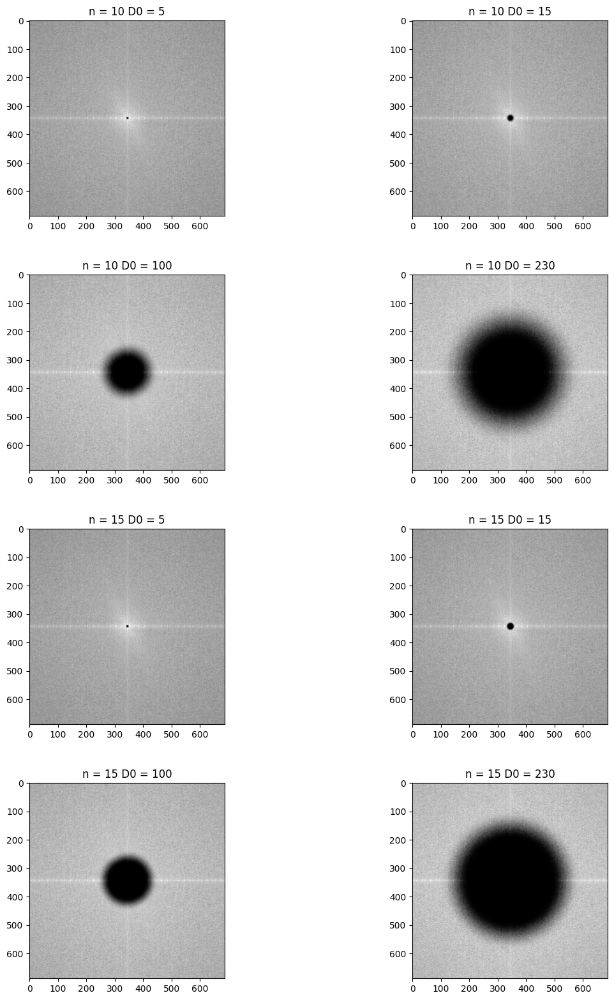

In [66]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,2,1)
    plt.imshow(G_9, cmap='gray')
    plt.title('n = 10 D0 = 5')

    plt.subplot(4,2,2)
    plt.imshow(G_10, cmap='gray')
    plt.title('n = 10 D0 = 15')

    plt.subplot(4,2,3)
    plt.imshow(G_11, cmap='gray')
    plt.title('n = 10 D0 = 100')

    plt.subplot(4,2,4)
    plt.imshow(G_12, cmap='gray')
    plt.title('n = 10 D0 = 230')

    plt.subplot(4,2,5)
    plt.imshow(G_13, cmap='gray')
    plt.title('n = 15 D0 = 5')

    plt.subplot(4,2,6)
    plt.imshow(G_14, cmap='gray')
    plt.title('n = 15 D0 = 15')

    plt.subplot(4,2,7)
    plt.imshow(G_15, cmap='gray')
    plt.title('n = 15 D0 = 100')

    plt.subplot(4,2,8)
    plt.imshow(G_16, cmap='gray')
    plt.title('n = 15 D0 = 230')

    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

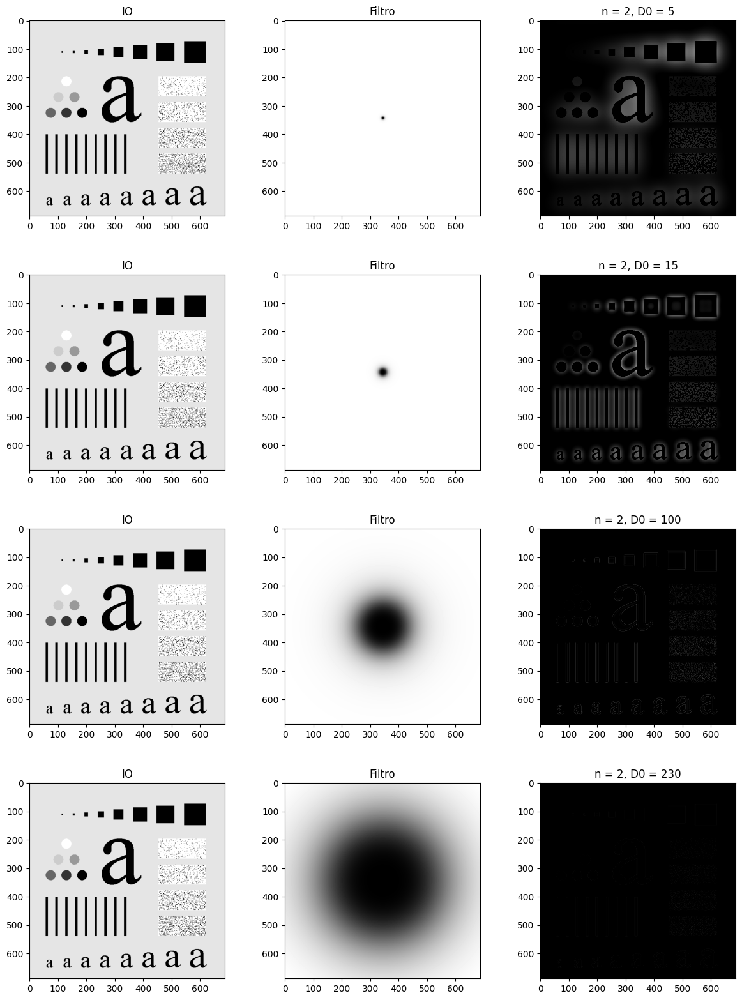

In [17]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H_1, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_1, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H_2, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_2, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H_3, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_3, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H_4, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_4e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

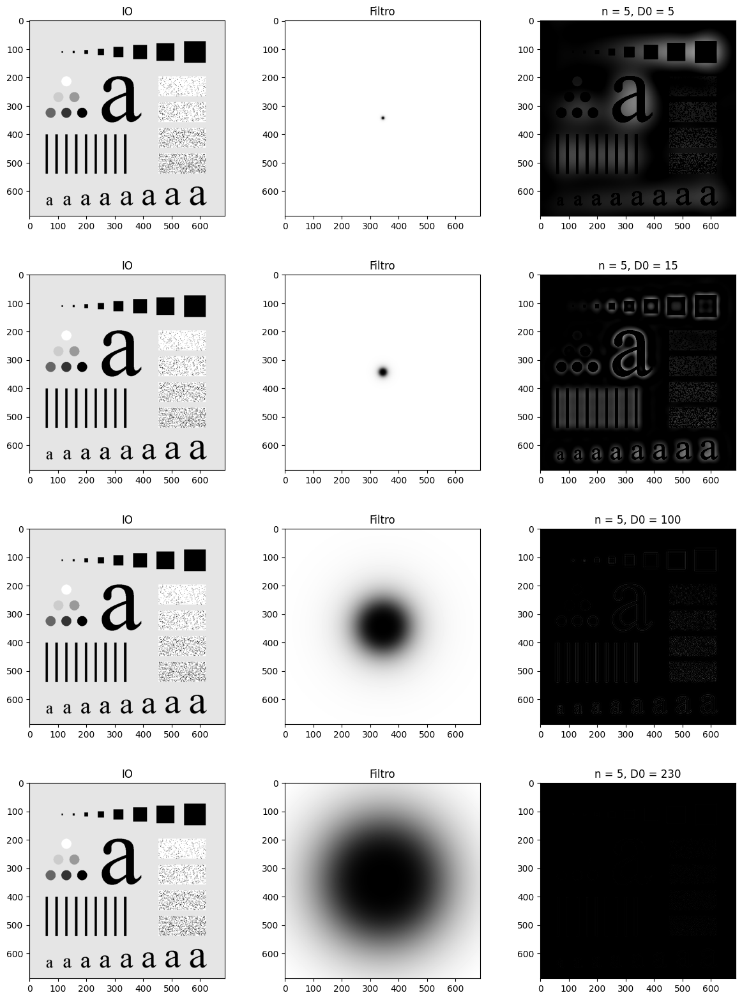

In [73]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H_5, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_4, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 5, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H_6, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_5, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 5, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H_7, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_6, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 5, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H_8, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_6e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 5, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

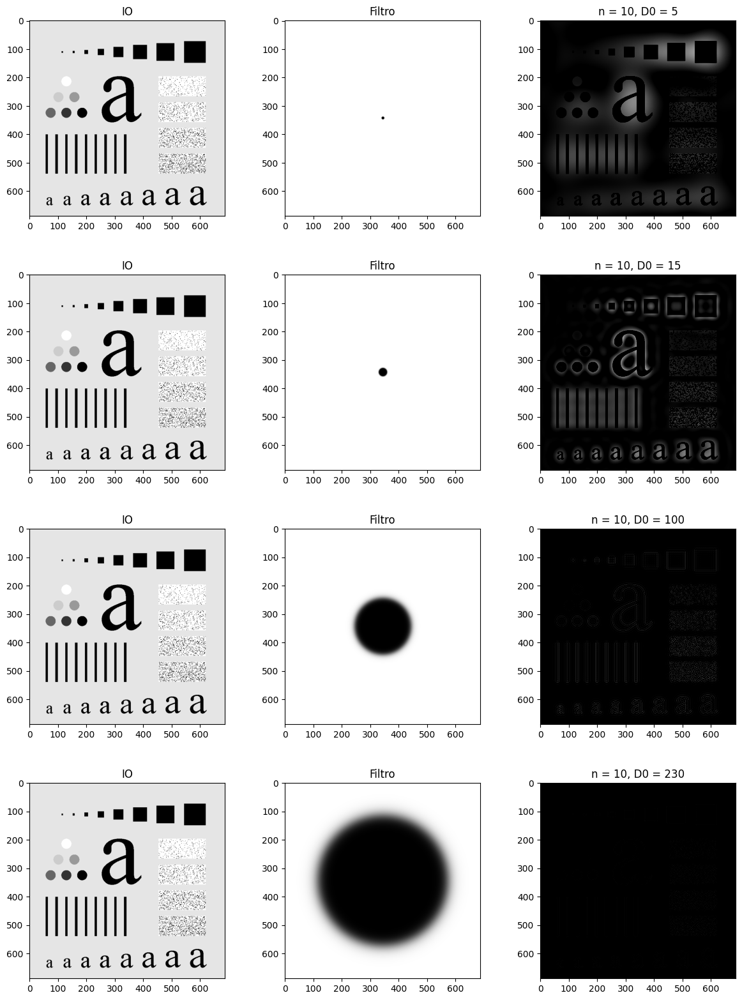

In [41]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H_9, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_7, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 10, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H_10, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_8, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 10, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,8)
    plt.imshow(H_11, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_9, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 10, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H_12, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_9e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 10, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

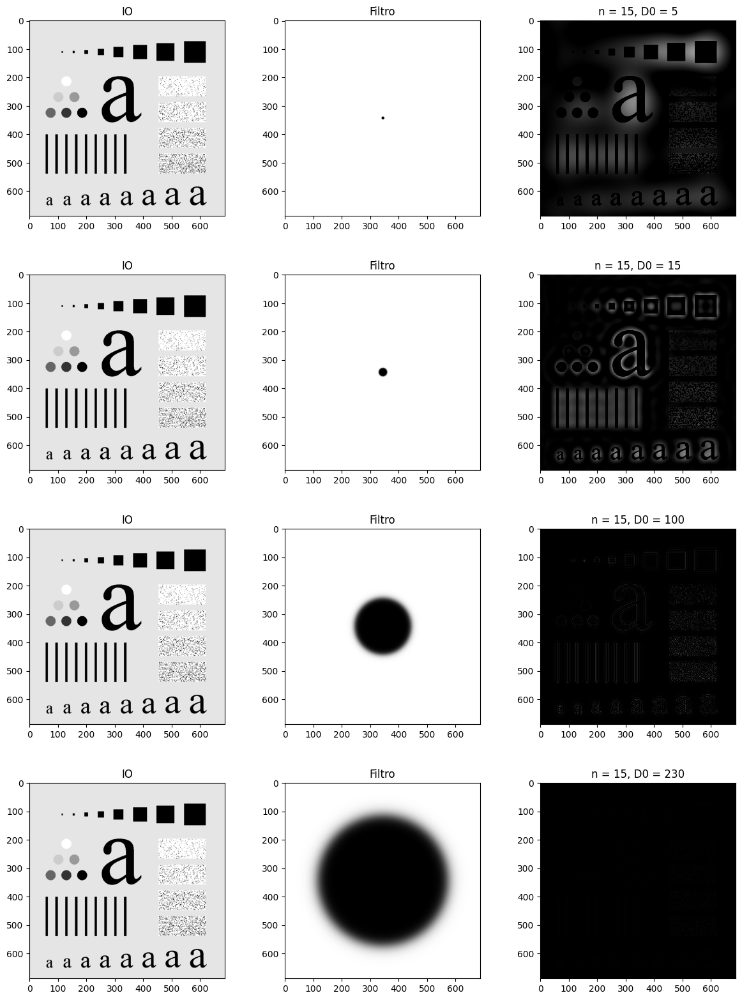

In [75]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,2)
    plt.imshow(H_13, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_10, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 15, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,5)
    plt.imshow(H_14, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_11, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 15, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')


    plt.subplot(4,3,8)
    plt.imshow(H_15, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_12, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 15, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
    plt.title('IO')

    plt.subplot(4,3,11)
    plt.imshow(H_16, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_12e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 15, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

In [76]:
### n = 2
iMg_1_1 ,H1_13  = apply_FB_pb(img_ruidoSP2,5,2,'pa')
iMg_2_2 ,H1_14  = apply_FB_pb(img_ruidoSP2,15,2,'pa')
iMg_3_3 ,H1_15  = apply_FB_pb(img_ruidoSP2,100,2,'pa')
iMg_3_3_e,H1_16 = apply_FB_pb(img_ruidoSP2,230,2,'pa')
#### n = 5
iMg_4_4,H_17 = apply_FB_pb(img_ruidoSP2,5,5,'pa')
iMg_5_5, H_18 = apply_FB_pb(img_ruidoSP2,15,5,'pa')
iMg_6_6 ,H_19= apply_FB_pb(img_ruidoSP2,100,5,'pa')
iMg_6_6_e ,H_20 = apply_FB_pb(img_ruidoSP2,230,5,'pa')
### n = 10
iMg_7_7 ,H_21= apply_FB_pb(img_ruidoSP2,5,10,'pa')
iMg_8_8 ,H_22= apply_FB_pb(img_ruidoSP2,15,10,'pa')
iMg_9_9 ,H_23 = apply_FB_pb(img_ruidoSP2,100,10,'pa')
iMg_9_9_e ,H_24 = apply_FB_pb(img_ruidoSP2,230,10,'pa')
## n = 2 direferente D0
iMg_10_10 ,H_25 = apply_FB_pb(img_ruidoSP2,5,15,'pa')
iMg_11_11, H_26 = apply_FB_pb(img_ruidoSP2,15,15,'pa')
iMg_12_12 , H_27 = apply_FB_pb(img_ruidoSP2,100,15,'pa')
iMg_12_12_e,H_28 = apply_FB_pb(img_ruidoSP2,230,15,'pa')

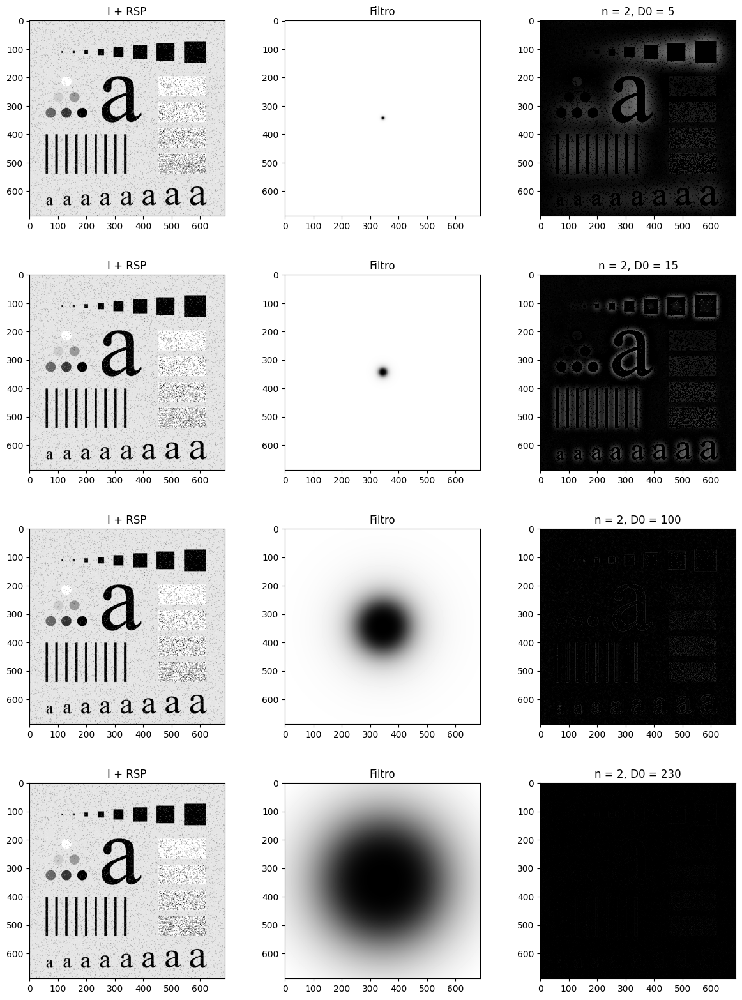

In [77]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H1_13, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_1_1, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H1_14, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_2_2, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H1_15, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_3_3, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H1_16, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_3_3_e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

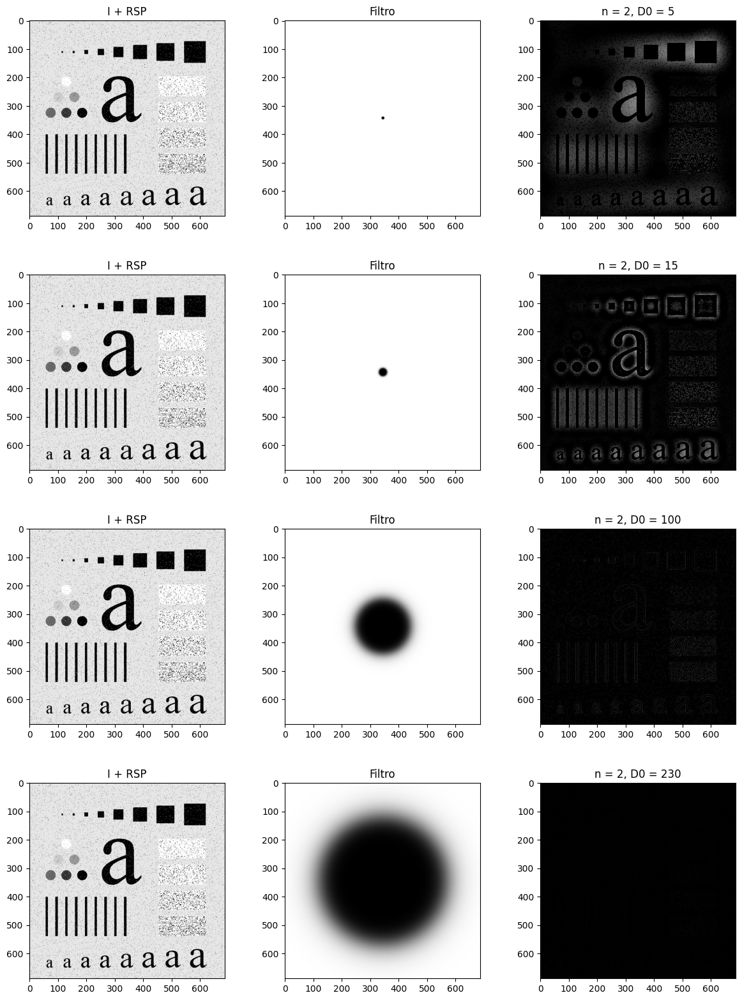

In [79]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H_17, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_4_4, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H_18, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_5_5, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H_19, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_6_6, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H_20, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_6_6_e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

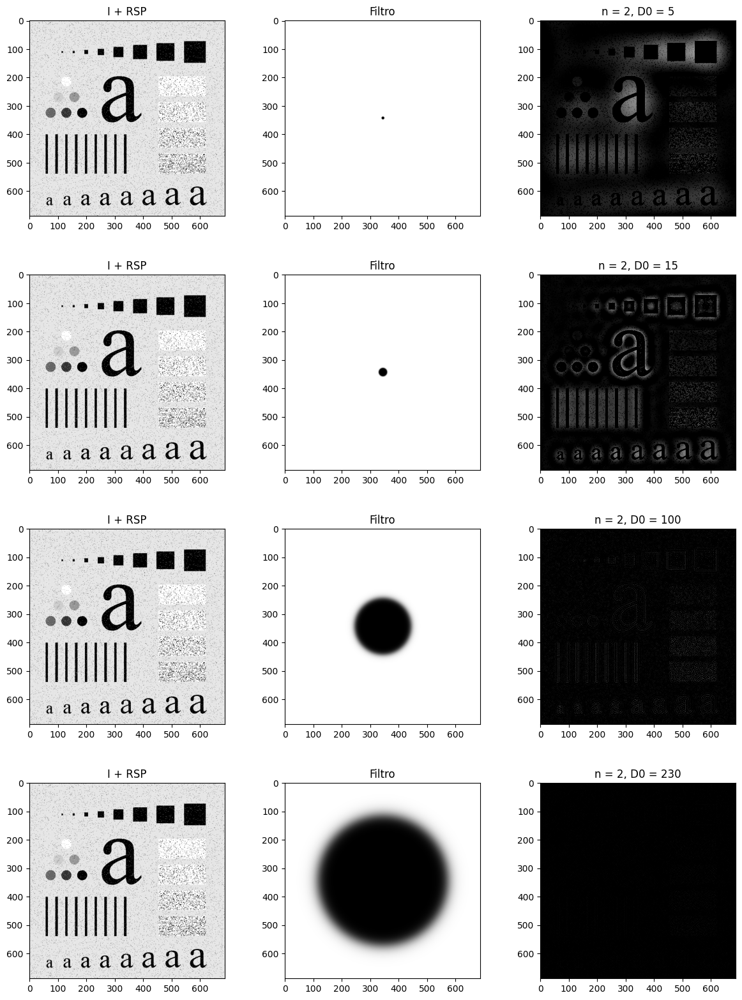

In [80]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H_21, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_7_7, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H_22, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_8_8, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H_23, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_9_9, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H_24, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_9_9_e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)

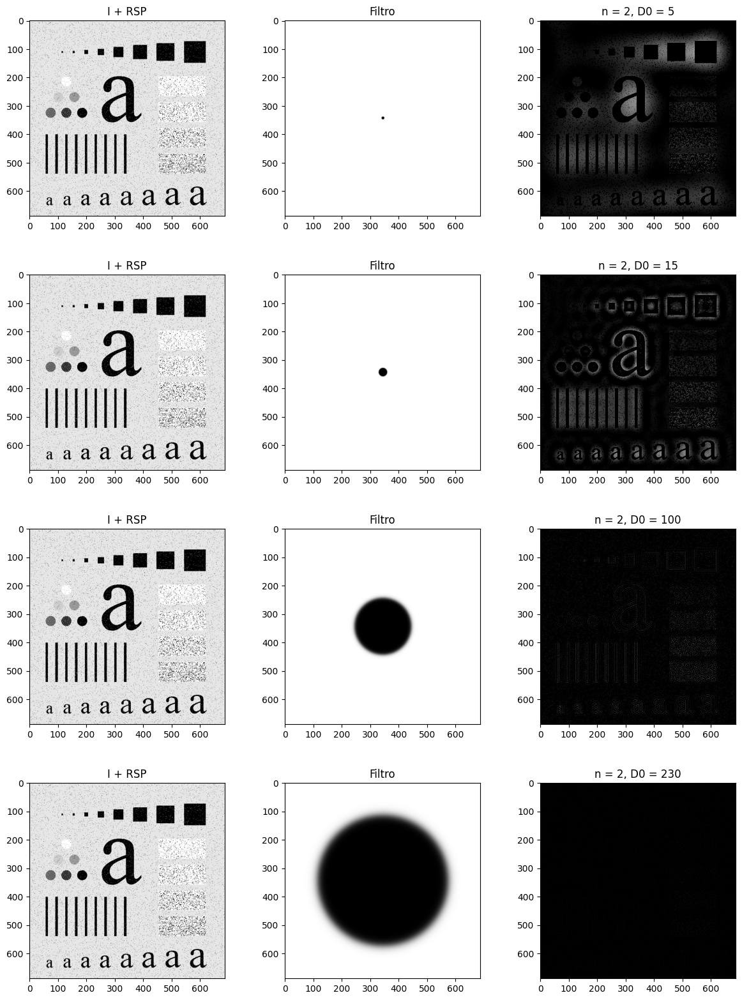

In [81]:
    plt.figure(figsize=(30, 30))
    plt.subplot(4,3,1)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,2)
    plt.imshow(H_25, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,3)
    plt.imshow(iMg_10_10, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 5')

    plt.subplot(4,3,4)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,5)
    plt.imshow(H_26, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,6)
    plt.imshow(iMg_11_11, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 15')

    plt.subplot(4,3,7)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,8)
    plt.imshow(H_27, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,9)
    plt.imshow(iMg_12_12, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 100')

    plt.subplot(4,3,10)
    plt.imshow(img_ruidoSP2, cmap='gray', vmin=0, vmax=255)
    plt.title('I + RSP')

    plt.subplot(4,3,11)
    plt.imshow(H_28, cmap='gray')
    plt.title('Filtro')

    plt.subplot(4,3,12)
    plt.imshow(iMg_12_12_e, cmap='gray', vmin=0, vmax=255)
    plt.title('n = 2, D0 = 230')


    plt.subplots_adjust(left=0.1, right=0.5, bottom=0.1, top=0.6, wspace=0, hspace=0.3)